#Model No : 6


In [1]:
!lscpu

Architecture:                    x86_64
CPU op-mode(s):                  32-bit, 64-bit
Byte Order:                      Little Endian
Address sizes:                   46 bits physical, 48 bits virtual
CPU(s):                          12
On-line CPU(s) list:             0-11
Thread(s) per core:              2
Core(s) per socket:              6
Socket(s):                       1
NUMA node(s):                    1
Vendor ID:                       GenuineIntel
CPU family:                      6
Model:                           85
Model name:                      Intel(R) Xeon(R) CPU @ 2.20GHz
Stepping:                        7
CPU MHz:                         2200.164
BogoMIPS:                        4400.32
Hypervisor vendor:               KVM
Virtualization type:             full
L1d cache:                       192 KiB
L1i cache:                       192 KiB
L2 cache:                        6 MiB
L3 cache:                        38.5 MiB
NUMA node0 CPU(s):               0-11
Vulnerabi

In [2]:
!nvidia-smi

Tue Feb 14 12:16:11 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    54W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!pip install torch==1.10.0+cu111 torchvision==0.11.1+cu111 torchtext==0.11.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!pip install mmdet==2.17.0
!pip install icevision[all]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 GB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 38.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 95.1 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
  Attempting uninstall: torchtext
    Found existing installation: torchtext 0.14.1
    Uninstalling torchtext-0.14.1:
      Successfully uninstalled torchtext-0.14.1
ERROR: pip's dependency resolver does not currently take into acc

In [4]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install gdown -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!gdown '1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d'

Downloading...
From: https://drive.google.com/uc?id=1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d
To: /content/COCONUT.zip
100% 32.8M/32.8M [00:00<00:00, 181MB/s]


In [4]:
!gdown "1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH"

Downloading...
From: https://drive.google.com/uc?id=1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH
To: /content/Copy of test_VOC.zip
100% 7.02M/7.02M [00:00<00:00, 114MB/s]


In [5]:
!unzip -qq "COCONUT.zip"

In [6]:
!unzip -qq "Copy of test_VOC.zip"

In [7]:
!pip install sahi==0.10.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.5/95.5 KB 7.5 MB/s eta 0:00:00
  Attempting uninstall: sahi
    Found existing installation: sahi 0.11.11
    Uninstalling sahi-0.11.11:
      Successfully uninstalled sahi-0.11.11


In [8]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:67
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


  0%|          | 0/1837152 [00:00<?, ?B/s]

In [9]:
data_dir = "/content/test_VOC"

# Create the parser
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)

# Parse annotations to create records
train_records, valid_records = parser.parse()

  0%|          | 0/501 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/501 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 000000_jpg.rf.d28af308cd3ea352827598e04f2efcef) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:1, ymin:169, xmax:73, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000001_jpg.rf.a59008af1bc9d8d06f9f797f537879ff) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:167, ymin:55, xmax:225, ymax:145)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:142, ymin:157, xmax:225, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:142, ymin:157, xmax:224, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) 

In [10]:
parser.class_map

<ClassMap: {'background': 0, 'coconut': 1}>

In [11]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 640


train_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [12]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

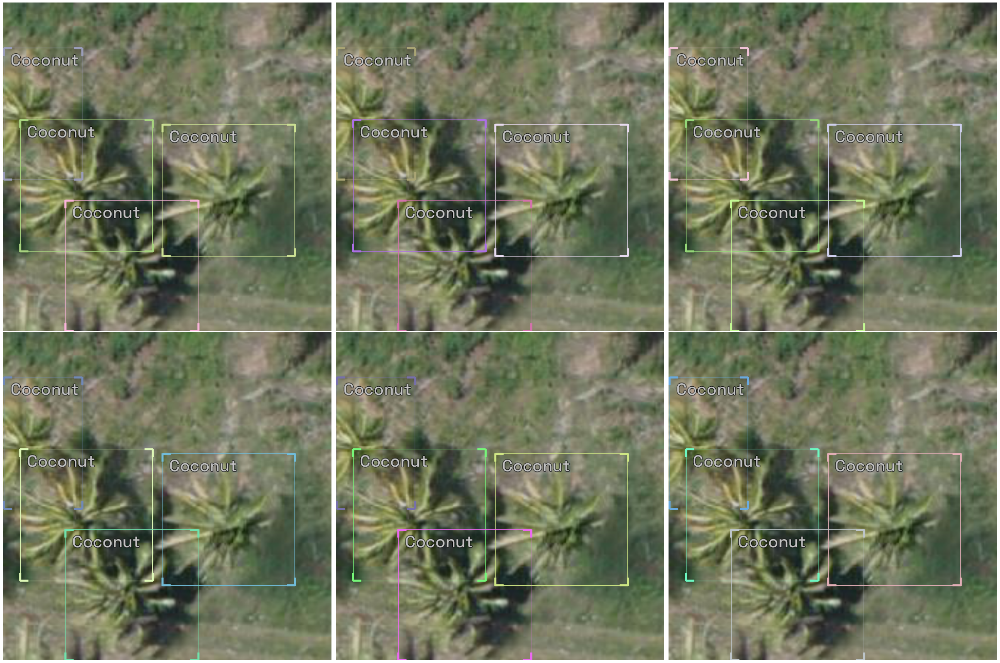

In [13]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

1,2,5,6,7,11-15

In [60]:
# Just change the value of selection to try another model

selection = 6

extra_args = {}

if selection == 0:
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x

if selection == 1:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x
  # extra_args['cfg_options'] = { 
  #   'model.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 2:
  model_type = models.mmdet.faster_rcnn
  backbone = model_type.backbones.resnet101_fpn_2x
  # extra_args['cfg_options'] = { 
  #   'model.roi_head.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.roi_head.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 3:
  model_type = models.mmdet.ssd
  backbone = model_type.backbones.ssd300

if selection == 4:
  model_type = models.mmdet.yolox
  backbone = model_type.backbones.yolox_s_8x8

if selection == 5:
  model_type = models.mmdet.yolof
  backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

if selection == 6:
  model_type = models.mmdet.detr #This can e tried as it works on small object
  backbone = model_type.backbones.r50_8x2_150e_coco

if selection == 7:
  model_type = models.mmdet.deformable_detr
  backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

if selection == 8:
  model_type = models.mmdet.fsaf
  backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

if selection == 9:
  model_type = models.mmdet.sabl
  backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

if selection == 10:
  model_type = models.mmdet.centripetalnet
  backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection == 11:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 12:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 13: #Mobile Deployment
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 14: #Best as of now
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.swin_t_p4_w7_fpn_1x_coco

elif selection == 15: #2nd Best
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x  

model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.detr' from '/usr/local/lib/python3.8/dist-packages/icevision/models/mmdet/models/detr/__init__.py'>,
 {})

In [61]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args)

  0%|          | 0/166698982 [00:00<?, ?B/s]

2023-02-14 15:18:38,471 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2023-02-14 15:18:38,473 - mmcv - INFO - load model from: torchvision://resnet50
2023-02-14 15:18:38,474 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

2023-02-14 15:18:39,093 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2023-02-14 15:18:39,210 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-14 15:18:39,212 - mmcv - INFO - 
backbone.bn1.weight - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-14 15:18:39,215 - mmcv - INFO - 
backbone.bn1.bias - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-14 15:18:39,216 - mmcv - INFO - 
backbone.layer1.0.conv1.weight - torch.Size([64, 64, 1, 1]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-14 15:18:39,218 - mmcv - INFO - 
backbone.layer1.0.bn1.weight - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-14 15:18:39,219 - mmcv - INFO - 
backbone.layer1.0.bn1.bias - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50

load checkpoint from local path: checkpoints/detr/detr_r50_8x2_150e_coco_20201130_194835-2c4b8974.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 256]) from checkpoint, the shape in current model is torch.Size([2, 256]).
size mismatch for bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).


In [62]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=4, num_workers=8, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=8, shuffle=False)

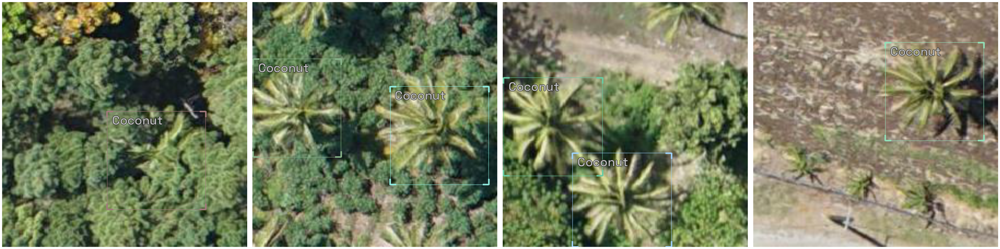

In [63]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [64]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox, print_summary=True)]

In [65]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics, cbs=[SaveModelCallback(fname='/content/cheque_yolov5_medium')])

In [66]:
learn.save('test')

Path('models/test.pth')

In [67]:
import time
begin = time.time()

learn.fine_tune(150, 1e-3, freeze_epochs=15)
end = time.time()

epoch,train_loss,valid_loss,COCOMetric,time
0,9.887094,8.745621,0.055399,00:27
1,8.156323,7.162766,0.087651,00:27
2,7.024894,6.349841,0.108711,00:28
3,6.019278,5.796959,0.235773,00:27
4,5.670302,5.667291,0.426343,00:27
5,5.769003,5.417799,0.436573,00:28
6,6.010577,6.299899,0.313406,00:27
7,6.126722,6.429228,0.282271,00:27
8,6.926412,7.698842,0.130713,00:28
9,11.030500,12.454351,0.009061,00:27


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.055
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.111
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.055
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.074
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.229
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.623
Better model found at epoch 0 with v

epoch,train_loss,valid_loss,COCOMetric,time
0,4.916845,4.552118,0.545698,00:28
1,4.793421,4.460704,0.548241,00:28
2,4.478305,4.503112,0.535568,00:28
3,4.335132,4.670732,0.511115,00:29
4,4.207672,4.597089,0.553089,00:28
5,4.093205,4.430749,0.541519,00:28
6,4.033813,4.579515,0.541730,00:29
7,4.116189,4.474074,0.549645,00:28
8,4.218296,4.419348,0.565302,00:28
9,4.039100,4.377903,0.562407,00:29


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.546
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.862
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.646
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.546
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.278
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.706
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.791
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.791
Better model found at epoch 0 with v

epoch,train_loss,valid_loss,COCOMetric,time
0,4.916845,4.552118,0.545698,00:28
1,4.793421,4.460704,0.548241,00:28
2,4.478305,4.503112,0.535568,00:28
3,4.335132,4.670732,0.511115,00:29
4,4.207672,4.597089,0.553089,00:28
5,4.093205,4.430749,0.541519,00:28
6,4.033813,4.579515,0.541730,00:29
7,4.116189,4.474074,0.549645,00:28
8,4.218296,4.419348,0.565302,00:28
9,4.039100,4.377903,0.562407,00:29


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.014
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.014
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.014
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.014
 Average Precision  (AP) @[ IoU=0.50

In [78]:
print(f"Total runtime of the program is {end - begin}")

Total runtime of the program is 4828.72060918808


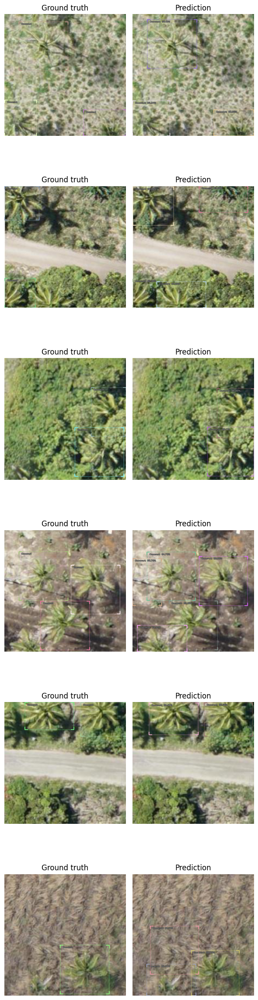

In [79]:
model_type.show_results(model, valid_ds, detection_threshold=.4)

In [80]:
data_dir = "/content/COCONUT"
spliter =RandomSplitter([0, 0, 1.0], seed=42)
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)
_,_,test_records = parser.parse(spliter)
image_size = 640

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
test_ds = Dataset(test_records, test_tfms)

  0%|          | 0/379 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/379 [00:00<?, ?it/s]

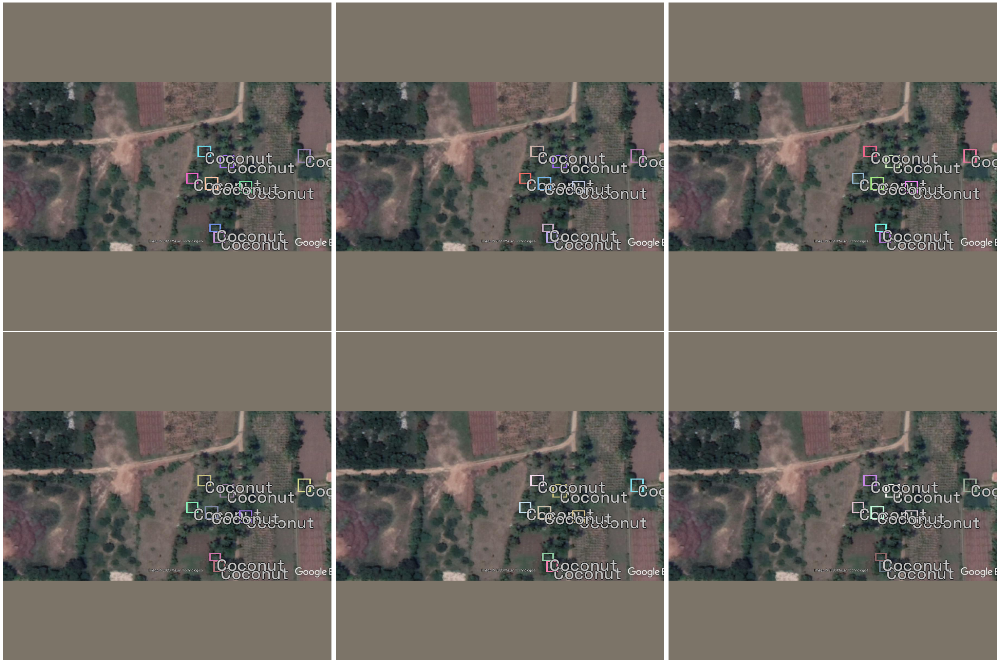

In [81]:
# Show an element of the train_ds with augmentation transformations applied
samples = [test_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

In [82]:
test_dl = model_type.valid_dl(test_ds, batch_size=4, num_workers=8, shuffle=False)

# Test Accuracy

In [83]:
learn.validate(dl=test_dl) 

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.004
Better model found at epoch 0 with valid

(#2) [57.44576644897461,1.4343856081780632e-07]

In [ ]:
model_type.show_results(model, test_ds, detection_threshold=.4)

# Train Accuracy

In [ ]:
learn.validate()

# Change model No in model_no.zip

In [ ]:
import os

path = "/content/drive/MyDrive/Model_6"
os.mkdir(path)

In [77]:
# change path

In [54]:
!cp /content/models/test.pth /content/drive/MyDrive/Model_6

# Saving Metadata

In [55]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

In [56]:
from icevision.models import *

 model_type = models.mmdet.detr #This can e tried as it works on small object
  backbone = model_type.backbones.r50_8x2_150e_coco

In [84]:
# How to save a model and its metadata
checkpoint_path = '/content/full_model6.pth'
save_icevision_checkpoint(model, 
                        model_name='mmdet.detr', 
                        backbone_name='r50_8x2_150e_coco',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [85]:
!cp /content/full_model6.pth /content/drive/MyDrive/Model_6